# Network Analysis of 'MiBici' Public Bike Service in Guadalajara's Metropolitan Area

## Authors:
Henry Marie MONT (C311035) and Matteo MATONE (C40241) 
University of Tartu, Department of Computer Science  
Tartu, Estonia  
Email: henry.marie.mont@ut.ee, matone@ut.ee

## Data exploration

### Import required libraries

In [92]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import random
import numpy as np
import math
import folium
from folium.plugins import HeatMap
import community.community_louvain as community_louvain
import calendar


### Load data

In [93]:
# Load MiBici dataset
mibici_df = pd.read_csv('data/mibici_2014-2024/mibici_2014-2024.csv')

# Load nomenclature dataset
nomenclature_df = pd.read_csv('data/nomenclature_2024.csv')

### Explore data

In [94]:
# Display basic information about the nomenclature dataset
print("\nNomenclature Dataset Information:")
print(nomenclature_df.info())

# Display the first few rows of the nomenclature dataset
print("\nFirst few rows of Nomenclature Dataset:")
print(nomenclature_df.head())

# Summary statistics of numerical columns in the nomenclature dataset
print("\nSummary statistics of numerical columns:")
print(nomenclature_df.describe())

# Check for missing values in the nomenclature dataset
print("\nMissing values in Nomenclature Dataset:")
print(nomenclature_df.isnull().sum())

# Display basic information about the MiBici dataset
print("MiBici Dataset Information:")
print(mibici_df.info())

# Display the first few rows of the MiBici dataset
print("\nFirst few rows of MiBici Dataset:")
print(mibici_df.head())

# Summary statistics of numerical columns in the MiBici dataset
print("\nSummary statistics of numerical columns:")
print(mibici_df.describe())

# Check for missing values in the MiBici dataset
print("\nMissing values in MiBici Dataset:")
print(mibici_df.isnull().sum())


Nomenclature Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 372 entries, 0 to 371
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   id         372 non-null    int64  
 1   name       372 non-null    object 
 2   obcn       372 non-null    object 
 3   location   372 non-null    object 
 4   latitude   372 non-null    float64
 5   longitude  372 non-null    float64
 6   status     372 non-null    object 
dtypes: float64(2), int64(1), object(4)
memory usage: 20.5+ KB
None

First few rows of Nomenclature Dataset:
   id                                           name     obcn  \
0   2  (GDL-001) C. Epigmenio Glez./ Av. 16 de Sept.  GDL-001   
1   3     (GDL-002) C. Colonias  / Av.  Niños héroes  GDL-002   
2   4          (GDL-003) C. Vidrio / Av. Chapultepec  GDL-003   
3   5           (GDL-004) C. Ghilardi /C. Miraflores  GDL-004   
4   6  (GDL-005) C. San Diego /Calzada Independencia  GDL-005   

 

In [95]:
# Display unique values for the 'location' column
unique_locations = nomenclature_df['location'].unique()
print("Unique values for 'location' column:")
print(unique_locations)

# Display unique values for the 'status' column
unique_statuses = nomenclature_df['status'].unique()
print("Unique values for 'status' column:")
print(unique_statuses)

Unique values for 'location' column:
['POLÍGONO CENTRAL' 'ZAPOPAN CENTRO' 'TLQ-CORREDORATLAS']
Unique values for 'status' column:
['IN_SERVICE' 'NOT_IN_SERVICE']


### Data preprocessing

In [96]:
# Let's first prune the data as it was way too long to work on those 2.4 GB of data with our machines

# Let's try to keep 1/10th of the data
fraction_to_keep = 0.01

# Calculate the number of rows to keep for each dataset
num_rows_mibici = int(len(mibici_df) * fraction_to_keep)

# Randomly select a subset of rows for each dataset
pruned_mibici_df = mibici_df.sample(n=num_rows_mibici, random_state=42)

# Export the pruned dataset
pruned_mibici_df.to_csv('data/mibici_2014-2024/mibici_compact.csv', index=False)

# Print the shape of the pruned datasets
print("Shape of pruned MiBici dataset:", pruned_mibici_df.shape)

Shape of pruned MiBici dataset: (258636, 11)


In [97]:
# Drop stations that are 'NOT_IN_SERVICE'
nomenclature_df = nomenclature_df[nomenclature_df['status'] != 'NOT_IN_SERVICE']

# Drop the columns 'obcn', 'location', and 'status'
nomenclature_df.drop(columns=['obcn', 'location', 'status'], inplace=True)

In [98]:
# Convert 'Trip_start' and 'Trip_end' columns to datetime objects
pruned_mibici_df['Trip_start'] = pd.to_datetime(pruned_mibici_df['Trip_start'])
pruned_mibici_df['Trip_end'] = pd.to_datetime(pruned_mibici_df['Trip_end'])

# Convert 'Duration' column to numerical format (seconds)
pruned_mibici_df['Duration'] = pd.to_timedelta(pruned_mibici_df['Duration']).dt.total_seconds()

# Extract additional features from datetime columns
pruned_mibici_df['Day_of_week'] = pruned_mibici_df['Trip_start'].dt.dayofweek
pruned_mibici_df['Hour_of_day'] = pruned_mibici_df['Trip_start'].dt.hour
pruned_mibici_df['Month'] = pruned_mibici_df['Trip_start'].dt.month

# Drop unnecessary columns
pruned_mibici_df.drop(columns=['Unnamed: 0', 'User_Id', 'Sex', 'Birth_year', 'Age'], inplace=True)

### Display pre-processed data

In [99]:
# Display basic information about the nomenclature dataset
print("\nNomenclature Dataset Information:")
print(nomenclature_df.info())

# Display the first few rows of the nomenclature dataset
print("\nFirst few rows of Nomenclature Dataset:")
print(nomenclature_df.head())

# Display basic information about the MiBici dataset
print("MiBici Dataset Information:")
print(pruned_mibici_df.info())

# Display the first few rows of the MiBici dataset
print("\nFirst few rows of MiBici Dataset:")
print(pruned_mibici_df.head())


Nomenclature Dataset Information:
<class 'pandas.core.frame.DataFrame'>
Index: 359 entries, 0 to 371
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   id         359 non-null    int64  
 1   name       359 non-null    object 
 2   latitude   359 non-null    float64
 3   longitude  359 non-null    float64
dtypes: float64(2), int64(1), object(1)
memory usage: 14.0+ KB
None

First few rows of Nomenclature Dataset:
   id                                           name   latitude   longitude
0   2  (GDL-001) C. Epigmenio Glez./ Av. 16 de Sept.  20.666378 -103.348820
1   3     (GDL-002) C. Colonias  / Av.  Niños héroes  20.667228 -103.366000
2   4          (GDL-003) C. Vidrio / Av. Chapultepec  20.667690 -103.368252
3   5           (GDL-004) C. Ghilardi /C. Miraflores  20.691750 -103.362550
4   6  (GDL-005) C. San Diego /Calzada Independencia  20.681158 -103.339363
MiBici Dataset Information:
<class 'pandas.core.frame.DataFra

## Building network

In [100]:
# Initialize an empty directed graph
G = nx.DiGraph()

# Add nodes (stations) to the graph from the Nomenclature dataset
for idx, row in nomenclature_df.iterrows():
    G.add_node(row['id'], name=row['name'], latitude=row['latitude'], longitude=row['longitude'])

# Add edges (bike trips) to the graph from the MiBici dataset
for idx, row in pruned_mibici_df.iterrows():
    origin_id = row['Origin_Id']
    destination_id = row['Destination_Id']
    if G.has_node(origin_id) and G.has_node(destination_id):
        # Check if both origin and destination stations exist in the graph
        if G.has_edge(origin_id, destination_id):
            # If an edge already exists, increment the weight (number of trips)
            G[origin_id][destination_id]['weight'] += 1
        else:
            # If no edge exists, add a new edge with weight 1
            G.add_edge(origin_id, destination_id, weight=1)

# Print some basic information about the graph
print("Number of nodes (stations):", G.number_of_nodes())
print("Number of edges (bike trips):", G.number_of_edges())

Number of nodes (stations): 359
Number of edges (bike trips): 37349


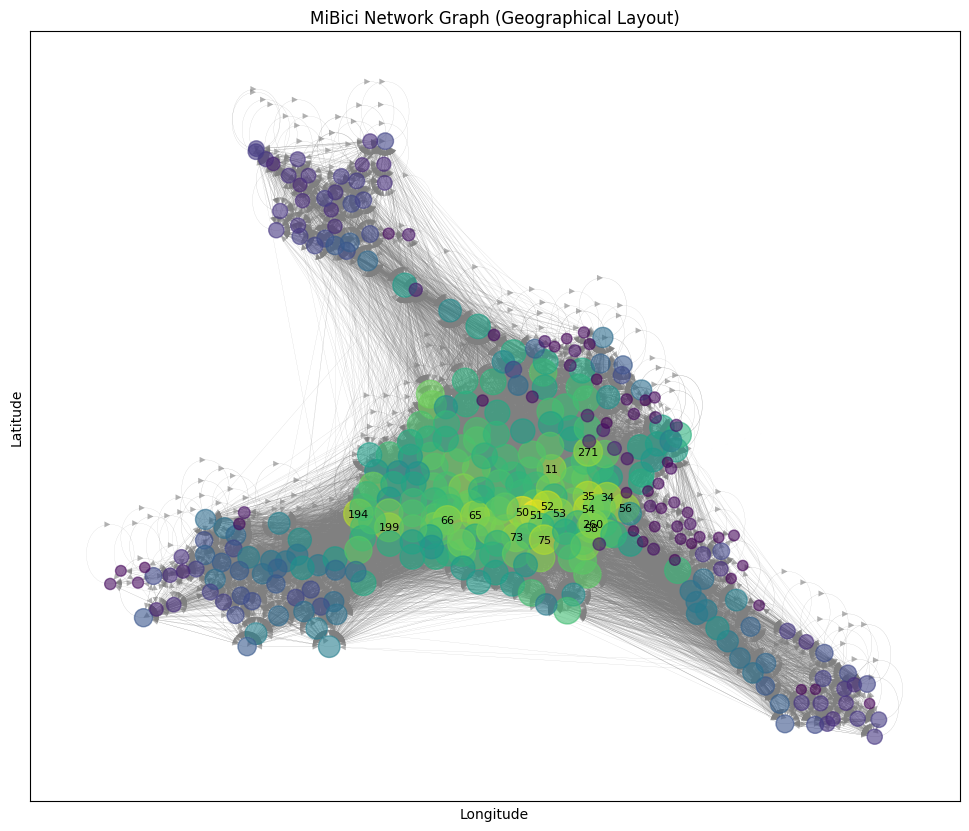

In [101]:
# Define positions for nodes based on latitude and longitude
node_positions = {node_id: (data['longitude'], data['latitude']) for node_id, data in G.nodes(data=True)}

# Calculate node degrees (number of edges per node)
node_degrees = dict(G.degree())
max_degree = max(node_degrees.values())

# Normalize node size and edge width for better visualization
node_size = [50 + 450 * (node_degrees[node] / max_degree) for node in G.nodes()]
edge_width = [0.1 + 1.9 * (G[u][v].get('weight', 1) / max_degree) for u, v in G.edges()]

# Assign colors based on node degree
node_color = [plt.cm.viridis(node_degrees[node] / max_degree) for node in G.nodes()]

# Draw the network graph with improved readability
plt.figure(figsize=(12, 10))
nx.draw_networkx(
    G,
    pos=node_positions,
    with_labels=False,  # Turn off all labels for now
    node_size=node_size,
    node_color=node_color,
    edge_color='gray',
    alpha=0.6,  # Transparency for edges
    width=edge_width
)

# Adding selective labels (for nodes with the highest degree)
high_degree_nodes = [node for node, degree in node_degrees.items() if degree > np.percentile(list(node_degrees.values()), 95)]
nx.draw_networkx_labels(G, pos=node_positions, labels={node: node for node in high_degree_nodes}, font_size=8, font_color='black')

plt.title('MiBici Network Graph (Geographical Layout)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Save the image
plt.savefig('images/mibici-network.png')

# Show the plot
plt.show()

In [102]:
# Create a map centered at the mean latitude and longitude of all stations
mean_lat = sum(pos[1] for pos in node_positions.values()) / len(node_positions)
mean_lon = sum(pos[0] for pos in node_positions.values()) / len(node_positions)
m = folium.Map(location=[mean_lat, mean_lon], zoom_start=12)

# Add markers for each station
for node, data in G.nodes(data=True):
    if node in node_positions:
        name = data['name']
        lat, lon = node_positions[node]
        folium.CircleMarker(location=[lat, lon], radius=5, color='blue', fill=True, fill_color='blue', fill_opacity=0.7, popup=name).add_to(m)

# Add heat map for edges
edges = [(u, v) for u, v in G.edges()]
edge_weights = [G[u][v].get('weight', 1) for u, v in edges]
edge_lat_lon = [[node_positions[u], node_positions[v]] for u, v in edges if u in node_positions and v in node_positions]
heat_map_data = [(p1[1], p1[0], weight) for (p1, p2), weight in zip(edge_lat_lon, edge_weights) for _ in range(weight)]

HeatMap(heat_map_data, radius=10, blur=5).add_to(m)

# Display the map
m

In [103]:
# Basic Entities of a Network
nodes = G.number_of_nodes()
edges = G.number_of_edges()
print("Basic Entities of the Network:")
print("Nodes/Vertices:", nodes)
print("Edges/Connections:", edges)

# Network Metrics
if nx.is_strongly_connected(G):
    # For strongly connected graphs, compute metrics for the largest strongly connected component
    scc = max(nx.strongly_connected_components(G), key=len)
    largest_scc_graph = G.subgraph(scc)
    avg_path_length = nx.average_shortest_path_length(largest_scc_graph)
    try:
        diameter = nx.diameter(largest_scc_graph)
    except nx.NetworkXError:
        diameter = "Diameter computation not applicable for strongly connected graphs"
else:
    # For graphs that are not strongly connected, compute metrics for the largest weakly connected component
    wcc = max(nx.weakly_connected_components(G), key=len)
    largest_wcc_graph = G.subgraph(wcc)
    avg_path_length = nx.average_shortest_path_length(largest_wcc_graph)
    diameter = None

print("\nNetwork Metrics:")
print("Average Path Length:", avg_path_length)
print("Diameter:", diameter)
print("Strongly connected", nx.is_strongly_connected(G))

# Types of Graphs/Networks
# Nodes and Neighbors
nodes = G.nodes()
neighbors = {node: list(G.neighbors(node)) for node in nodes}
print("\nNodes and Neighbors:")
print("Nodes:", nodes)
print("Neighbors:", neighbors)

# Node Degree Distribution
degree_distribution = nx.degree_histogram(G)
print("\nNode Degree Distribution:")
print(degree_distribution)

# Connected Component
connected_components = wcc if not nx.is_strongly_connected(G) else scc
print("\nConnected Components:")
print(connected_components)

# Dyads
reciprocity = nx.reciprocity(G) if nx.is_directed(G) else None
density = nx.density(G)
print("\nDyads:")
print("Reciprocity:", reciprocity)
print("Density:", density)

# Triads
clustering_coefficient = nx.average_clustering(G)
print("\nTriads:")
print("Clustering Coefficient:", clustering_coefficient)

# K-cores
G.remove_edges_from(nx.selfloop_edges(G))  # Remove self-loops
k_cores = nx.core_number(G)
print("\nK-cores:")
print(k_cores)

# Assortativity and Disassortativity
assortativity = nx.degree_assortativity_coefficient(G)
print("\nAssortativity:")
print("Assortativity Coefficient:", assortativity)

Basic Entities of the Network:
Nodes/Vertices: 359
Edges/Connections: 37349

Network Metrics:
Average Path Length: 1.8143897542833134
Diameter: None
Strongly connected False

Nodes and Neighbors:
Nodes: [2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 91, 92, 93, 94, 95, 96, 98, 100, 101, 102, 103, 104, 105, 106, 107, 108, 110, 111, 112, 115, 117, 118, 119, 120, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 139, 140, 141, 142, 143, 144, 145, 146, 148, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 

### Preprocessing nodes in the graph

In [104]:
# Calculate the average degree of the graph
average_degree = sum(dict(G.degree()).values()) / len(G)

print("Average degree of the graph:", average_degree)

Average degree of the graph: 206.3008356545961


In [105]:
# Get the degrees of nodes in the graph
degrees = list(dict(G.degree()).values())

# Calculate the lower quartile (Q1) using numpy's percentile function
lower_quartile = np.percentile(degrees, 25)

print("Lower quartile (Q1) of the node degrees:", lower_quartile)

Lower quartile (Q1) of the node degrees: 72.0


In [106]:
# Remove disconnected nodes
G.remove_nodes_from(list(nx.isolates(G)))

# Remove nodes with a low number of edges (e.g., less than 2)
nodes_to_remove = [node for node, degree in dict(G.degree()).items() if degree < 74]
G.remove_nodes_from(nodes_to_remove)

# Print some basic information about the graph after pre-processing
print("Number of nodes after pre-processing:", G.number_of_nodes())
print("Number of edges after pre-processing:", G.number_of_edges())

Number of nodes after pre-processing: 266
Number of edges after pre-processing: 34391


### Visualizing bike station distribution over the years

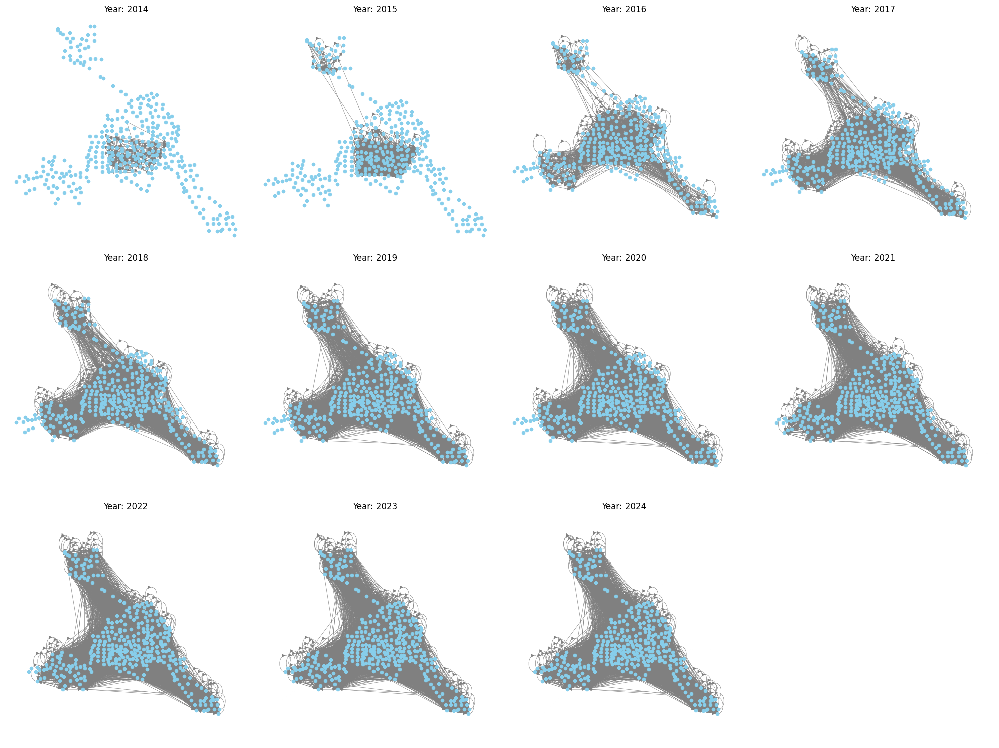

In [107]:
# Initialize an empty dictionary to store graphs by year
graphs_by_year = {}

# Extract the year from the 'Trip_start' column and add it as a new column
pruned_mibici_df['year'] = pruned_mibici_df['Trip_start'].dt.year

# Get a list of unique years in the dataset
unique_years = sorted(pruned_mibici_df['year'].unique())

# Create an empty graph to accumulate edges over the years
accumulated_graph = nx.DiGraph()

# Add nodes (stations) to the accumulated graph from the Nomenclature dataset
for idx, row in nomenclature_df.iterrows():
    accumulated_graph.add_node(row['id'], name=row['name'], latitude=row['latitude'], longitude=row['longitude'])

# Iterate over each year
for year in unique_years:
    # Filter the dataset to include only trips up to the current year
    year_data = pruned_mibici_df[pruned_mibici_df['year'] <= year]
    
    # Add edges (bike trips) to the accumulated graph for the current year
    for idx, row in year_data.iterrows():
        origin_id = row['Origin_Id']
        destination_id = row['Destination_Id']
        if accumulated_graph.has_node(origin_id) and accumulated_graph.has_node(destination_id):
            # Check if both origin and destination stations exist in the graph
            if accumulated_graph.has_edge(origin_id, destination_id):
                # If an edge already exists, increment the weight (number of trips)
                accumulated_graph[origin_id][destination_id]['weight'] += 1
            else:
                # If no edge exists, add a new edge with weight 1
                accumulated_graph.add_edge(origin_id, destination_id, weight=1)
    
    # Make a copy of the accumulated graph for the current year
    graphs_by_year[year] = accumulated_graph.copy()

# Determine the grid size
num_years = len(unique_years)
cols = 4  # Number of columns
rows = (num_years + cols - 1) // cols  # Number of rows

# Create a grid of subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Plot the graph for each year
for i, year in enumerate(unique_years):
    ax = axes[i]
    G_year = graphs_by_year[year]
    # Get positions based on latitude and longitude
    pos = {node: (data['longitude'], data['latitude']) for node, data in G_year.nodes(data=True)}
    nx.draw_networkx(G_year, pos, with_labels=False, node_size=20, node_color='skyblue', edge_color='gray', width=0.5, ax=ax)
    ax.set_title(f"Year: {year}")
    ax.axis('off')  # Turn off the axis

# Hide any unused subplots (if any)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### Visualizing bike traffic dedpending on month of the year

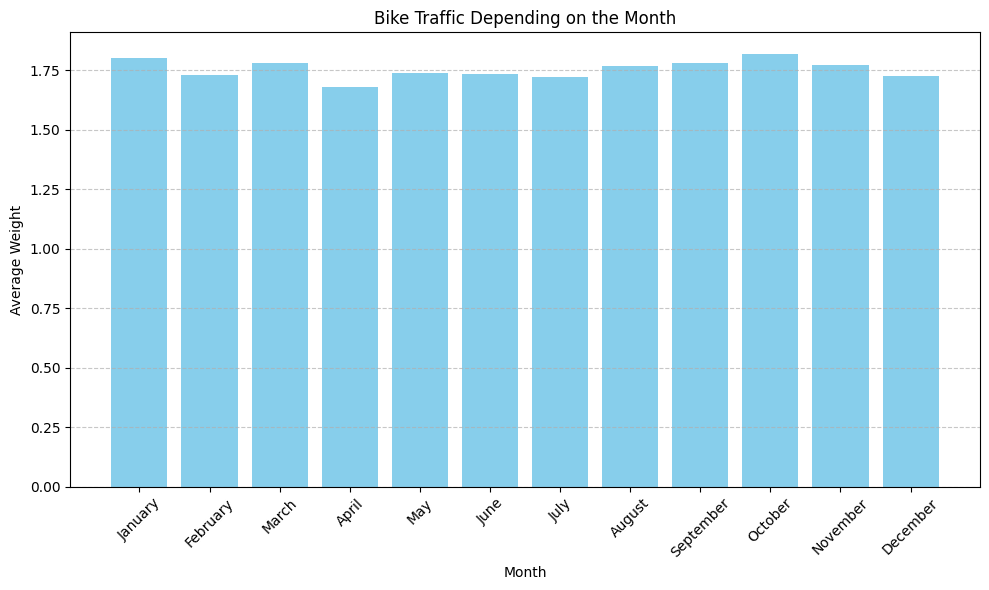

Average weight for January: 1.8038313038313039
Average weight for February: 1.7299603007010727
Average weight for March: 1.783068783068783
Average weight for April: 1.6816418583671628
Average weight for May: 1.7397929118612678
Average weight for June: 1.7368331344809953
Average weight for July: 1.7231320368474923
Average weight for August: 1.7680163599182004
Average weight for September: 1.7793131313131314
Average weight for October: 1.819395484887122
Average weight for November: 1.7715430861723447
Average weight for December: 1.7260424596126194


In [108]:
# Initialize empty dictionaries to store graphs and average weights
graphs_by_month = {}
average_weights_by_month = {}

# Split the dataset by month
grouped_by_month = pruned_mibici_df.groupby(pruned_mibici_df['Trip_start'].dt.month)

# Iterate over each month
for month, group_data in grouped_by_month:
    # Create a new directed graph for the month
    G_month = nx.DiGraph()
    
    # Add nodes (stations) to the graph from the Nomenclature dataset
    for idx, row in nomenclature_df.iterrows():
        G_month.add_node(row['id'], name=row['name'], latitude=row['latitude'], longitude=row['longitude'])
    
    # Add edges (bike trips) to the graph from the MiBici dataset for the current month
    for idx, row in group_data.iterrows():
        origin_id = row['Origin_Id']
        destination_id = row['Destination_Id']
        if G_month.has_node(origin_id) and G_month.has_node(destination_id):
            # Check if both origin and destination stations exist in the graph
            if G_month.has_edge(origin_id, destination_id):
                # If an edge already exists, increment the weight (number of trips)
                G_month[origin_id][destination_id]['weight'] += 1
            else:
                # If no edge exists, add a new edge with weight 1
                G_month.add_edge(origin_id, destination_id, weight=1)
    
    # Store the graph for the current month
    graphs_by_month[month] = G_month
    
    # Compute the average weight for the current month
    total_weight = sum(data['weight'] for u, v, data in G_month.edges(data=True))
    num_edges = G_month.number_of_edges()
    average_weight = total_weight / num_edges if num_edges > 0 else 0
    average_weights_by_month[month] = average_weight

# Sort the average weights by month
sorted_average_weights_month = [average_weights_by_month[month] for month in range(1, 13)]

# Plot the bar plot
plt.figure(figsize=(10, 6))
plt.bar(calendar.month_name[1:], sorted_average_weights_month, color='skyblue')
plt.title('Bike Traffic Depending on the Month')
plt.xlabel('Month')
plt.ylabel('Average Weight')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Print the average weights for each month
for month in range(1, 13):
    average_weight = average_weights_by_month[month]
    print(f"Average weight for {calendar.month_name[month]}: {average_weight}")

### Visualizing bike traffic depending on weekdays

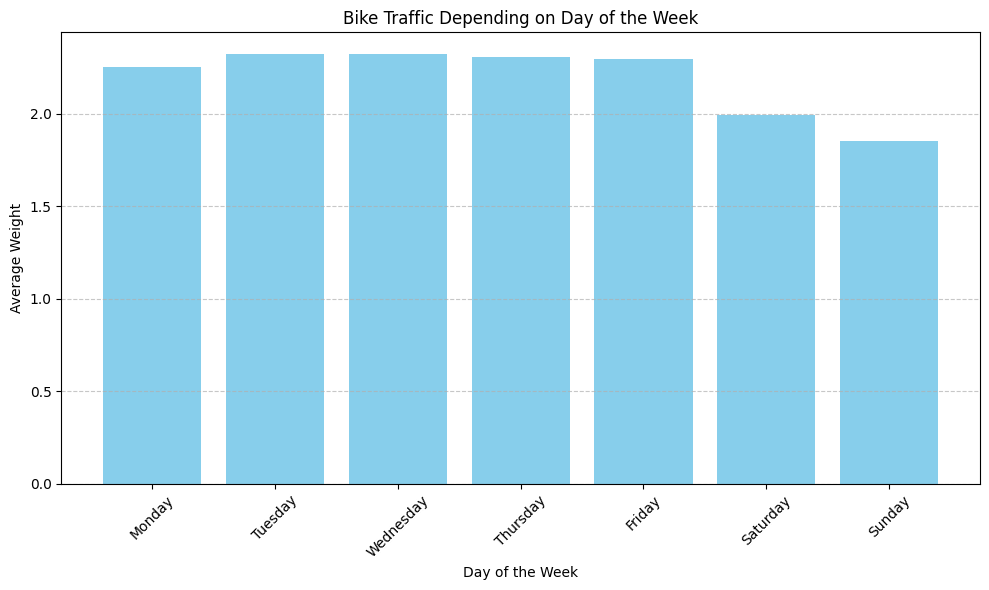

Average weight for Monday: 2.2529145444255803
Average weight for Tuesday: 2.320253708879811
Average weight for Wednesday: 2.323699110272311
Average weight for Thursday: 2.307531150071673
Average weight for Friday: 2.2940711462450594
Average weight for Saturday: 1.9931546752111855
Average weight for Sunday: 1.852798475134292


In [109]:
# Initialize empty dictionaries to store graphs and average weights
graphs_by_day = {}
average_weights_by_day = {}

# Split the dataset by day
grouped_by_day = pruned_mibici_df.groupby(pruned_mibici_df['Trip_start'].dt.day_name())

# Iterate over each day
for day, group_data in grouped_by_day:
    # Create a new directed graph for the day
    G_day = nx.DiGraph()
    
    # Add nodes (stations) to the graph from the Nomenclature dataset
    for idx, row in nomenclature_df.iterrows():
        G_day.add_node(row['id'], name=row['name'], latitude=row['latitude'], longitude=row['longitude'])
    
    # Add edges (bike trips) to the graph from the MiBici dataset for the current day
    for idx, row in group_data.iterrows():
        origin_id = row['Origin_Id']
        destination_id = row['Destination_Id']
        if G_day.has_node(origin_id) and G_day.has_node(destination_id):
            # Check if both origin and destination stations exist in the graph
            if G_day.has_edge(origin_id, destination_id):
                # If an edge already exists, increment the weight (number of trips)
                G_day[origin_id][destination_id]['weight'] += 1
            else:
                # If no edge exists, add a new edge with weight 1
                G_day.add_edge(origin_id, destination_id, weight=1)
    
    # Store the graph for the current day
    graphs_by_day[day] = G_day
    
    # Compute the average weight for the current day
    total_weight = sum(data['weight'] for u, v, data in G_day.edges(data=True))
    num_edges = G_day.number_of_edges()
    average_weight = total_weight / num_edges if num_edges > 0 else 0
    average_weights_by_day[day] = average_weight

# Define the order of days in a week
weekdays_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Sort the average weights by the order of days in a week
sorted_average_weights = [average_weights_by_day[day] for day in weekdays_order]

# Plot the bar plot
plt.figure(figsize=(10, 6))
plt.bar(weekdays_order, sorted_average_weights, color='skyblue')
plt.title('Bike Traffic Depending on Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Average Weight')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Print the average weights in the order of the days of the week
for day in weekdays_order:
    average_weight = average_weights_by_day[day]
    print(f"Average weight for {day}: {average_weight}")

### Visualizing bike traffic depending on hour of the day

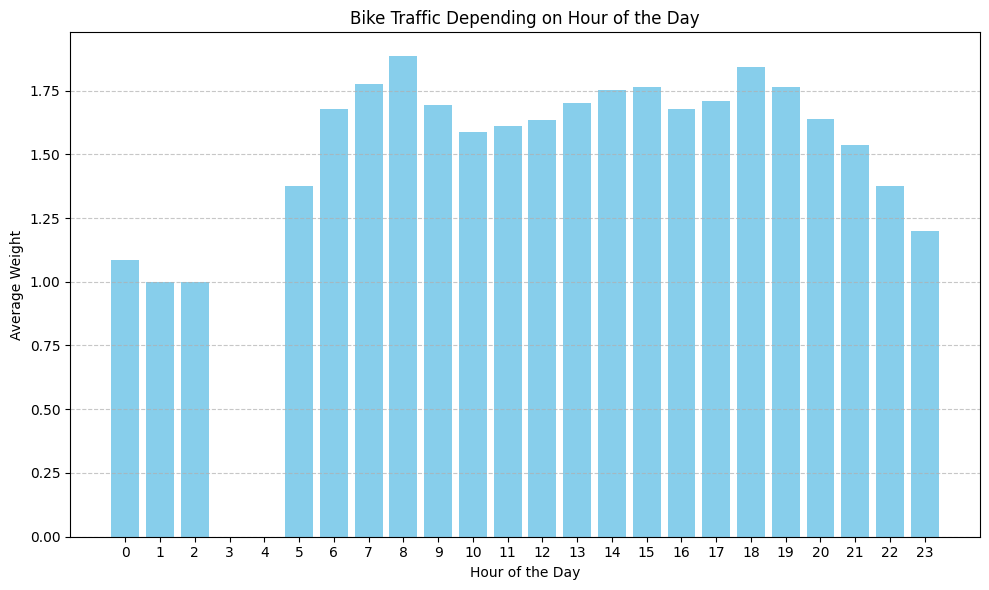

Average weight for hour 0: 1.0853462157809983
Average weight for hour 1: 1.0
Average weight for hour 2: 1.0
Average weight for hour 3: 0
Average weight for hour 4: 0
Average weight for hour 5: 1.375
Average weight for hour 6: 1.676339946698253
Average weight for hour 7: 1.7775554187192117
Average weight for hour 8: 1.8840764331210191
Average weight for hour 9: 1.6941228851291183
Average weight for hour 10: 1.5893167701863353
Average weight for hour 11: 1.609225413402959
Average weight for hour 12: 1.6336910872608492
Average weight for hour 13: 1.7017325448697997
Average weight for hour 14: 1.7538565368299268
Average weight for hour 15: 1.7627001383672662
Average weight for hour 16: 1.677860962566845
Average weight for hour 17: 1.7079942556247008
Average weight for hour 18: 1.8441488543749038
Average weight for hour 19: 1.7641932928439399
Average weight for hour 20: 1.6402182562237126
Average weight for hour 21: 1.5369310048668765
Average weight for hour 22: 1.3743778402943085
Average w

In [110]:
# Initialize empty dictionaries to store graphs and average weights
graphs_by_hour = {}
average_weights_by_hour = {}

# Split the dataset by hour
grouped_by_hour = pruned_mibici_df.groupby(pruned_mibici_df['Trip_start'].dt.hour)

# Iterate over each hour
for hour, group_data in grouped_by_hour:
    # Create a new directed graph for the hour
    G_hour = nx.DiGraph()
    
    # Add nodes (stations) to the graph from the Nomenclature dataset
    for idx, row in nomenclature_df.iterrows():
        G_hour.add_node(row['id'], name=row['name'], latitude=row['latitude'], longitude=row['longitude'])
    
    # Add edges (bike trips) to the graph from the MiBici dataset for the current hour
    for idx, row in group_data.iterrows():
        origin_id = row['Origin_Id']
        destination_id = row['Destination_Id']
        if G_hour.has_node(origin_id) and G_hour.has_node(destination_id):
            # Check if both origin and destination stations exist in the graph
            if G_hour.has_edge(origin_id, destination_id):
                # If an edge already exists, increment the weight (number of trips)
                G_hour[origin_id][destination_id]['weight'] += 1
            else:
                # If no edge exists, add a new edge with weight 1
                G_hour.add_edge(origin_id, destination_id, weight=1)
    
    # Store the graph for the current hour
    graphs_by_hour[hour] = G_hour
    
    # Compute the average weight for the current hour
    total_weight = sum(data['weight'] for u, v, data in G_hour.edges(data=True))
    num_edges = G_hour.number_of_edges()
    average_weight = total_weight / num_edges if num_edges > 0 else 0
    average_weights_by_hour[hour] = average_weight

# Define the order of hours in a day
hours_order = range(24)

# Initialize an empty list to store average weights
sorted_average_weights = []

# Iterate over each hour in the order
for hour in hours_order:
    # Check if the average weight for the hour exists in the dictionary
    if hour in average_weights_by_hour:
        sorted_average_weights.append(average_weights_by_hour[hour])
    else:
        # If the average weight for the hour doesn't exist, append 0
        sorted_average_weights.append(0)

# Plot the bar plot
plt.figure(figsize=(10, 6))
plt.bar(hours_order, sorted_average_weights, color='skyblue')
plt.title('Bike Traffic Depending on Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Weight')
plt.xticks(hours_order)  # Set x-axis ticks to show all hours
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Print the average weights in the order of the hours of the day
for hour in hours_order:
    average_weight = average_weights_by_hour.get(hour, 0)  # Get the value if exists, otherwise default to 0
    print(f"Average weight for hour {hour}: {average_weight}")

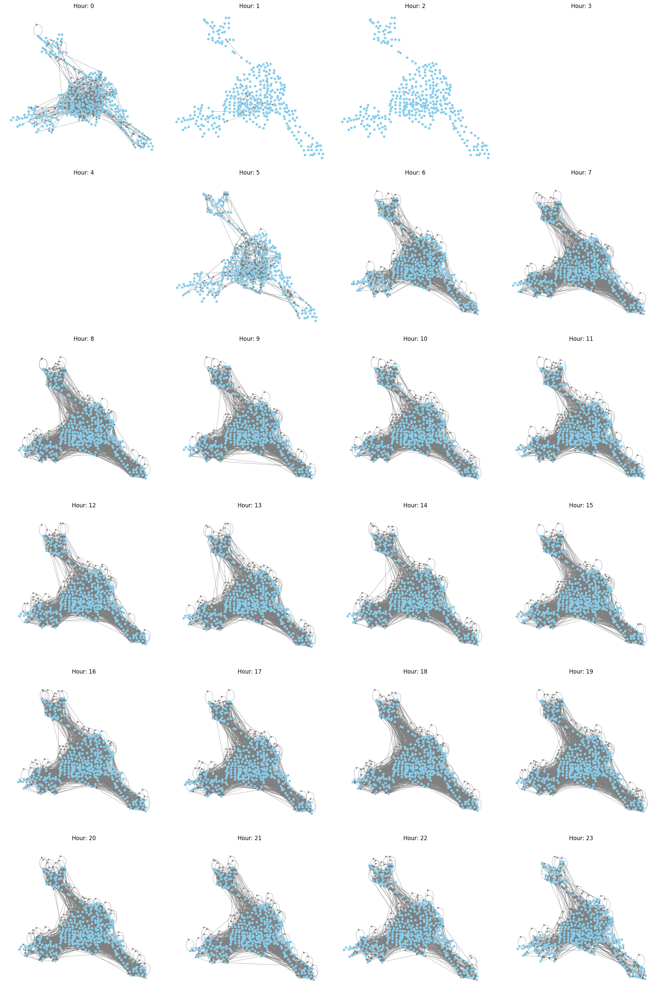

In [111]:
# Initialize empty dictionaries to store graphs
graphs_by_hour = {}

# Split the dataset by hour
grouped_by_hour = pruned_mibici_df.groupby(pruned_mibici_df['Trip_start'].dt.hour)

# Iterate over each hour
for hour, group_data in grouped_by_hour:
    # Create a new directed graph for the hour
    G_hour = nx.DiGraph()
    
    # Add nodes (stations) to the graph from the Nomenclature dataset
    for idx, row in nomenclature_df.iterrows():
        G_hour.add_node(row['id'], name=row['name'], latitude=row['latitude'], longitude=row['longitude'])
    
    # Add edges (bike trips) to the graph from the MiBici dataset for the current hour
    for idx, row in group_data.iterrows():
        origin_id = row['Origin_Id']
        destination_id = row['Destination_Id']
        if G_hour.has_node(origin_id) and G_hour.has_node(destination_id):
            # Check if both origin and destination stations exist in the graph
            if G_hour.has_edge(origin_id, destination_id):
                # If an edge already exists, increment the weight (number of trips)
                G_hour[origin_id][destination_id]['weight'] += 1
            else:
                # If no edge exists, add a new edge with weight 1
                G_hour.add_edge(origin_id, destination_id, weight=1)
    
    # Store the graph for the current hour
    graphs_by_hour[hour] = G_hour

# Determine the grid size
num_hours = 24
cols = 4  # Number of columns
rows = 6  # Number of rows

# Create a grid of subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, 30))
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Plot the graph for each hour
for hour in range(24):
    ax = axes[hour]
    if hour in graphs_by_hour:
        G_hour = graphs_by_hour[hour]
        # Get positions based on latitude and longitude
        pos = {node: (data['longitude'], data['latitude']) for node, data in G_hour.nodes(data=True)}
        nx.draw_networkx(G_hour, pos, with_labels=False, node_size=20, node_color='skyblue', edge_color='gray', width=0.5, ax=ax)
    ax.set_title(f"Hour: {hour}")
    ax.axis('off')  # Turn off the axis

# Hide any unused subplots (if any)
for i in range(hour + 1, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

### Visualizing the most important bike stations thanks to centrality measures

In [112]:
# Compute centrality measures
degree_centralities = nx.degree_centrality(G)
betweenness_centralities = nx.betweenness_centrality(G)
closeness_centralities = nx.closeness_centrality(G)

# Combine centrality measures for each node
centralities = {node: {
    'degree_centrality': degree_centralities.get(node, 0),
    'betweenness_centrality': betweenness_centralities.get(node, 0),
    'closeness_centrality': closeness_centralities.get(node, 0),
    'latitude': G.nodes[node]['latitude'],
    'longitude': G.nodes[node]['longitude']
} for node in G.nodes()}

# Extract key bike stations based on centrality measures
key_stations = sorted(centralities.items(), key=lambda x: (x[1]['degree_centrality'], x[1]['betweenness_centrality'], x[1]['closeness_centrality']), reverse=True)[:20]

# Print key bike stations and their locations
for node, data in key_stations:
    print(f"Station ID: {node}, Name: {G.nodes[node]['name']}, Latitude: {data['latitude']}, Longitude: {data['longitude']}")

Station ID: 51, Name: (GDL-049) Lopez Cotilla/ Marcos Castellanos, Latitude: 20.6740865, Longitude: -103.3563196
Station ID: 50, Name: (GDL-048) C. Constancio Hernández/ Av. Juaréz, Latitude: 20.674721, Longitude: -103.358548
Station ID: 52, Name: (GDL-050) C. Pedro Moreno / Calz. Federalismo, Latitude: 20.675746, Longitude: -103.354579
Station ID: 194, Name: (GDL-127) Av. Vallarta / Av. de Los Arcos, Latitude: 20.67438, Longitude: -103.38488
Station ID: 75, Name: (GDL-073) Av. La Paz / Av. Federalismo, Latitude: 20.669955, Longitude: -103.355032
Station ID: 54, Name: (GDL-052) Av. Juárez / Av. 16 de Septiembre, Latitude: 20.675244, Longitude: -103.347889
Station ID: 35, Name: (GDL-033) Av. Hidalgo / C. Pedro Loza, Latitude: 20.677419, Longitude: -103.347983
Station ID: 58, Name: (GDL-056) Av. 16 de Sept. / C. Miguel Blanco, Latitude: 20.671971, Longitude: -103.347422
Station ID: 65, Name: (GDL-063) C. Colonias  / C. López Cotilla, Latitude: 20.674132, Longitude: -103.366139
Station ID

In [113]:
# Create a map centered at the mean latitude and longitude of key stations
mean_lat = sum(key_stations_lat) / len(key_stations_lat)
mean_lon = sum(key_stations_lon) / len(key_stations_lon)
m = folium.Map(location=[mean_lat, mean_lon], zoom_start=12)

# Add markers for each key station
for node, data in key_stations:
    name = G.nodes[node]['name']
    lat = data['latitude']
    lon = data['longitude']
    folium.CircleMarker(location=[lat, lon], radius=5, color='blue', fill=True, fill_color='blue', fill_opacity=0.7, popup=name).add_to(m)

# Create heat map data
heat_map_data = [(data['latitude'], data['longitude']) for node, data in key_stations]

# Add heat map layer to the map
HeatMap(heat_map_data, radius=15, blur=10).add_to(m)

# Display the map
m

### Performing community detection to find clusters of stations with high interconnectivity

Number of communities: 5


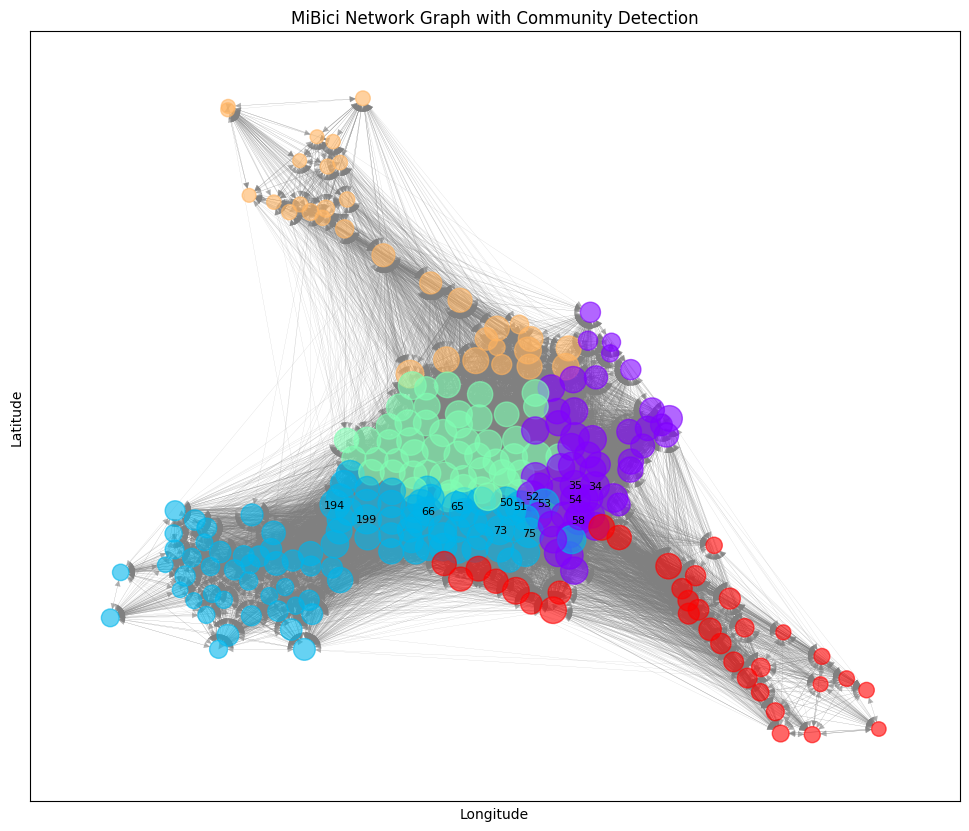

In [114]:
# Convert the directed graph G to an undirected graph
G_undirected = G.to_undirected()

# Perform community detection
partition = community_louvain.best_partition(G_undirected, weight='weight')

# Get the number of communities
num_communities = len(set(partition.values()))
print(f'Number of communities: {num_communities}')

# Define positions for nodes based on latitude and longitude
node_positions = {node_id: (data['longitude'], data['latitude']) for node_id, data in G.nodes(data=True)}

# Calculate node degrees (number of edges per node)
node_degrees = dict(G.degree())
max_degree = max(node_degrees.values())

# Normalize node size and edge width for better visualization
node_size = [50 + 450 * (node_degrees[node] / max_degree) for node in G.nodes()]
edge_width = [0.1 + 1.9 * (G[u][v].get('weight', 1) / max_degree) for u, v in G.edges()]

# Assign colors based on community
colors = cm.rainbow(np.linspace(0, 1, num_communities))
node_color = [colors[partition[node]] for node in G.nodes()]

# Draw the network graph with community coloring
plt.figure(figsize=(12, 10))
nx.draw_networkx(
    G,
    pos=node_positions,
    with_labels=False,  # Turn off all labels for now
    node_size=node_size,
    node_color=node_color,
    edge_color='gray',
    alpha=0.6,  # Transparency for edges
    width=edge_width
)

# Adding selective labels (for nodes with the highest degree)
high_degree_nodes = [node for node, degree in node_degrees.items() if degree > np.percentile(list(node_degrees.values()), 95)]
nx.draw_networkx_labels(G, pos=node_positions, labels={node: node for node in high_degree_nodes}, font_size=8, font_color='black')

plt.title('MiBici Network Graph with Community Detection')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Save the image
plt.savefig('images/mibici-network-communities.png')

# Show the plot
plt.show()